# Домашнее задание №3

Задание присылать на почту **aleksartmonov@gmail.com** в форматах *.ipynb* и отрендеренный результат в *.html*

В теме письма указать **AU2018 HW3 <Фамилия Имя>**

soft deadline: 18.03.2018T23:59:00+0300

hard deadline: 25.03.2018T23:59:00+0300


### Контуры, фильтрация, морфология

In [1]:
import numpy as np
import cv2
import matplotlib.pylab as plt
%matplotlib inline

def show(img, size=5, title=""):
    plt.figure(figsize=(size,size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    if len(img.shape) < 3:
        plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)


In [2]:
from sklearn.cluster import KMeans
from collections import Counter
from sklearn.cluster import DBSCAN
import glob
from sklearn.cluster import MeanShift, estimate_bandwidth

**1. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

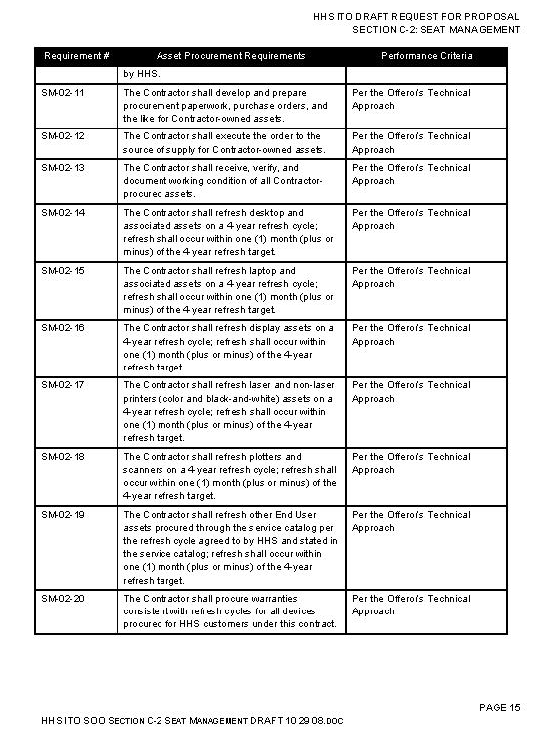

In [3]:
table = cv2.imread("table.jpg")
show(table, size=10)

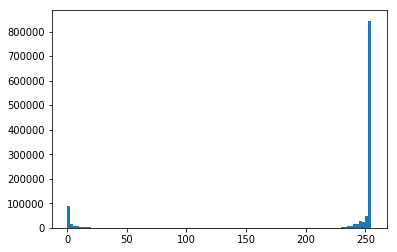

In [4]:
plt.hist(table.flatten(), 100);

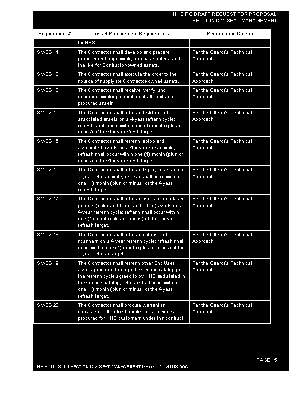

In [5]:
_, table_b = cv2.threshold(table, 127, 255, cv2.THRESH_BINARY_INV)
show(table_b)

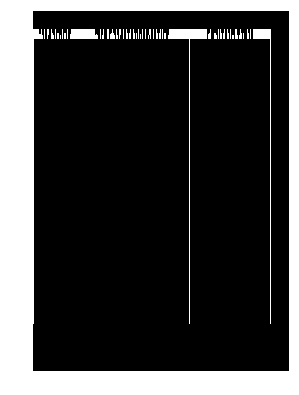

In [6]:
kernel = np.array([[0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0],
                   [0, 1, 0]], dtype=np.uint8)
verticals = cv2.erode(table_b, kernel, iterations = 1)
verticals = cv2.dilate(verticals, kernel, iterations = 1)

show(verticals)

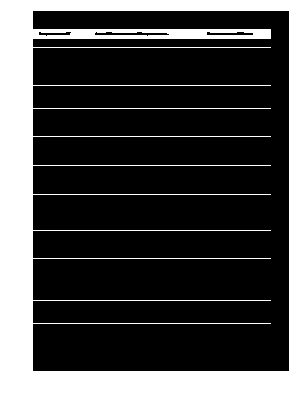

In [7]:
horizontals = cv2.erode(table_b, kernel.T, iterations = 1)
horizontals = cv2.dilate(horizontals, kernel.T, iterations = 1)

show(horizontals)

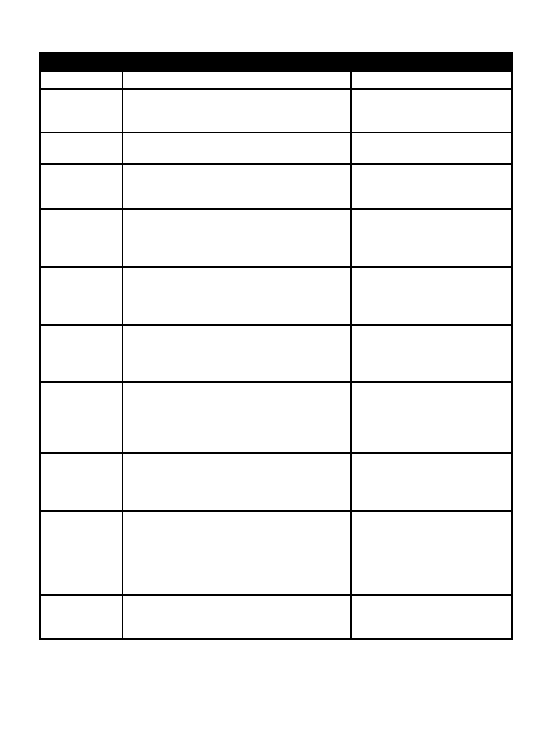

In [8]:
# aka "union"
lines = np.maximum(horizontals, verticals)

lines = cv2.dilate(lines, cv2.getStructuringElement(cv2.MORPH_RECT,(2,2)), iterations = 5)
lines = cv2.erode(lines, cv2.getStructuringElement(cv2.MORPH_RECT,(2,2)), iterations = 5)

res = 255 - lines
show(res, size=10)

**2. (5 баллов) ** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

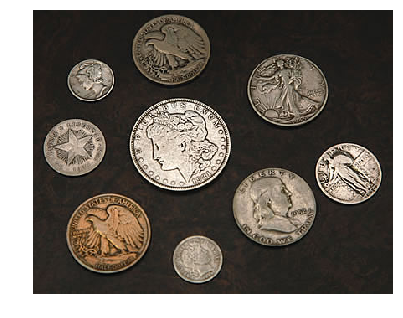

In [9]:
coins_1 = cv2.imread("coins_1.jpg")
show(coins_1)

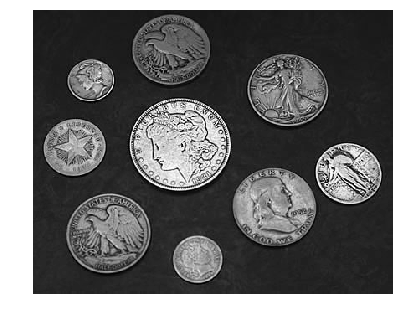

In [10]:
coins_1_gray = cv2.cvtColor(coins_1, cv2.COLOR_BGR2GRAY)
show(coins_1_gray)

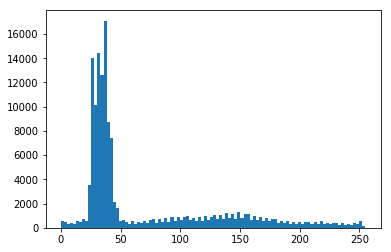

In [11]:
plt.hist(coins_1_gray.flatten(), 100);

99.0


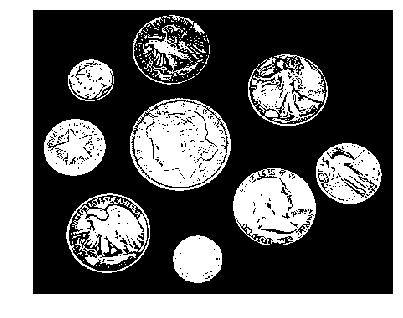

In [12]:
# Otsu's thresholding
threshold_val, coins_1_b = cv2.threshold(coins_1_gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
show(coins_1_b)
print(threshold_val)

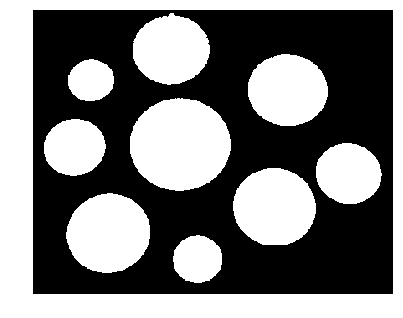

In [13]:
circles = cv2.morphologyEx(coins_1_b, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3)), 
                           iterations = 7)
circles = cv2.erode(circles, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5)), iterations = 2)
circles = cv2.erode(circles, cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3)), iterations = 2)

circles = np.maximum(coins_1_b, circles)
circles = cv2.morphologyEx(circles, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3)), 
                           iterations = 6)
show(circles)

In [14]:
X = np.argwhere(circles == 255)

n_clusters = 9
k_means = KMeans(init='k-means++', n_clusters=n_clusters)
k_means.fit(X)

k_means_labels = k_means.labels_
k_means_cluster_centers = k_means.cluster_centers_

In [15]:
ordered_classes = list(zip(*Counter(k_means_labels).most_common()))[0]
order = {}
for i in range(n_clusters):
    order[ordered_classes[i]] = i + 1

In [16]:
import seaborn as sns
sns.reset_orig() 

colors = sns.color_palette("Set2", 8) + [sns.color_palette("hls", 8)[0]]
colors = [(z*255, y*255, x*255) for (x,y,z) in colors]

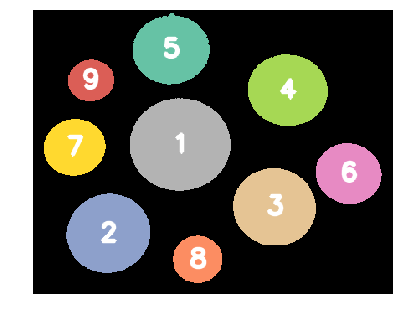

In [17]:
circles_color = cv2.cvtColor(circles, cv2.COLOR_GRAY2BGR)

for k, col in zip(range(n_clusters), colors):
    cur_cluster = k_means_labels == k
    coords = X[cur_cluster]
    for x, y in coords:
        circles_color[x, y] = col
    cluster_center = k_means_cluster_centers[k]
    cv2.putText(circles_color, str(order[k]), 
                (int(cluster_center[1])-9, int(cluster_center[0])+9),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 3, cv2.LINE_AA)

show(circles_color)

**3. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгенерируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

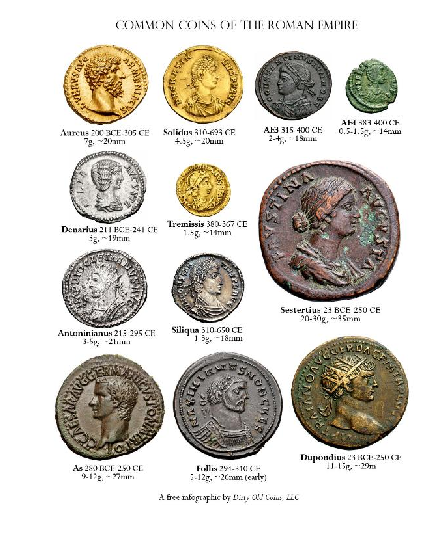

In [18]:
coins_2 = cv2.imread("coins_2.jpg")
show(coins_2, size=7)

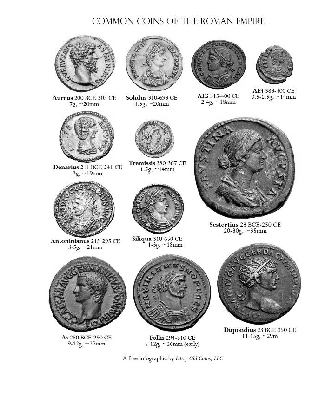

In [19]:
coins_2_gray = cv2.cvtColor(coins_2, cv2.COLOR_BGR2GRAY)
show(coins_2_gray)

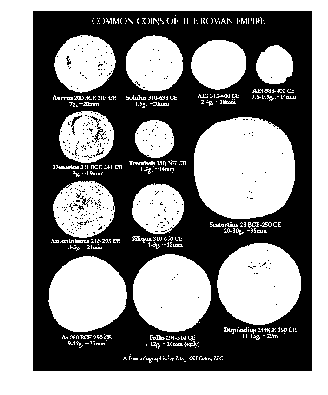

In [20]:
_, coins_2_b = cv2.threshold(coins_2_gray, 230, 255, cv2.THRESH_BINARY_INV)
show(coins_2_b)

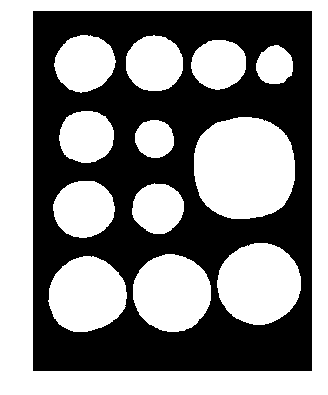

In [21]:
X = np.argwhere(coins_2_b == 255)

db = DBSCAN(eps=1, min_samples=3).fit(X)
db_labels = db.labels_

num_coins = 12
selected_clusters = list(zip(*Counter(db_labels).most_common(num_coins)))[0]

circles_2 = coins_2_b.copy()
for x, y in X[np.logical_not(np.isin(db_labels, selected_clusters))]:
    circles_2[x, y] = 0
    
circles_2 = cv2.morphologyEx(circles_2, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3)), 
                           iterations = 4)
    
show(circles_2)

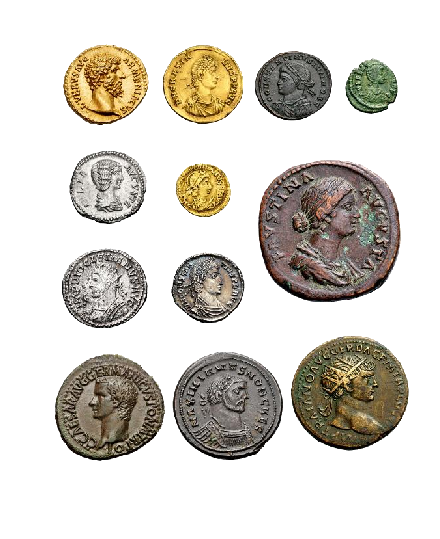

In [22]:
coins_only = coins_2.copy()

for x, y in np.argwhere(circles_2 != 255):
    coins_only[x, y, :] = 255

show(coins_only, size=7)

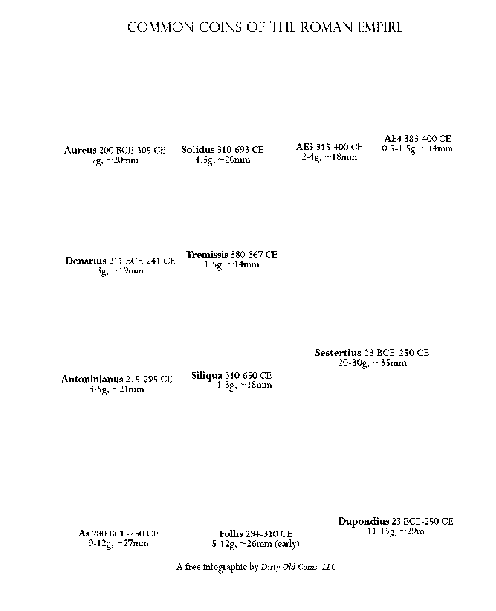

In [23]:
text_only = coins_2.copy()

for x, y in np.argwhere(circles_2 == 255):
    text_only[x, y, :] = 255

text_only = cv2.cvtColor(text_only, cv2.COLOR_BGR2GRAY)
threshold_val, text_only = cv2.threshold(text_only, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
show(text_only, size=8)

**4. (10 баллов) ** Для каждого из зашумленных изображений $coins\_noize\_1.jpg$, $coins\_noize\_2.jpg$, $coins\_noize\_3.jpg$: выделите целые монеты, сгруппируйте их по размеру и посчитайте число монет в каждой группе. На выходе программа должна выдавать полученное число групп монет, средний размер монеты для каждой группы и число монет в каждой группе, а также изображение, визуализирующее результат. На данном изображении на черном фоне должны быть цветом выделены области, соответствующие монетам. Монеты, принадлежащие одной группе, должны быть обозначены одним и тем же цветом. 

Это творческое задание, можно использовать функции типа *HoughCircles, fitEllipse* и тд. 

##### Алгоритм такой:
Убираем с изображения шумы, переводим в ч/б и приводим к виду, в котором будем искать круги.

Дальше ищем круги и выводим ответ следующей функцией:

In [46]:
def find_circles(img, search_params, img_orig, eps=5, q=0.3, draw1=True, draw2=True, draw3=True):
    
    circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, 
                               dp=search_params["dp"], minDist=search_params["minDist"],
                               param1=search_params["param1"], param2=search_params["param2"], 
                               minRadius=search_params["minRadius"], maxRadius=search_params["maxRadius"])

    circles = np.uint16(np.around(circles))

    img_copy = cv2.cvtColor(img.copy(), cv2.COLOR_GRAY2BGR)

    X = []
    sel_circles = []
    for i in circles[0,:]:
        x0, y0, r = map(int, i)
        if x0 - r >= -eps and y0 - r >= -eps and x0 + r < img.shape[1] + eps and y0 + r < img.shape[0] + eps:
            cv2.circle(img_copy,(x0,y0),r,(0,255,0),2)
            cv2.circle(img_copy,(x0,y0),2,(0,0,255),3)
            X.append(r)
            sel_circles.append(i)
    if draw1:
        show(img_copy, size=7)
    sel_circles = np.array(sel_circles)
    
    X = np.array(X).reshape(-1,1)
    bandwidth = estimate_bandwidth(X, quantile=q)
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
    ms.fit(X)
    n_clusters = len(np.unique(ms.labels_))
    
    cluster_img = np.zeros_like(coins_noize)
    img_orig_copy = img_orig.copy()
    for k in range(n_clusters):
        cur_members = ms.labels_ == k   
        for i in sel_circles[cur_members]:
            x0 = int(i[0])
            y0 = int(i[1])
            r = ms.cluster_centers_[k]
            cv2.circle(cluster_img,(x0,y0),r,colors[k],-1) 
            cv2.circle(img_orig_copy,(x0,y0),r,(0,255,0),2)
            cv2.circle(img_orig_copy,(x0,y0),2,(0,0,255),3)     
        cv2.putText(cluster_img, "%i" % round(ms.cluster_centers_[k][0]), (x0-18, y0+10),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 3, cv2.LINE_AA)     
    if draw2:
        show(img_orig_copy, size=7)
    if draw3:
        show(cluster_img, size=7, title="%s clusters" % n_clusters)

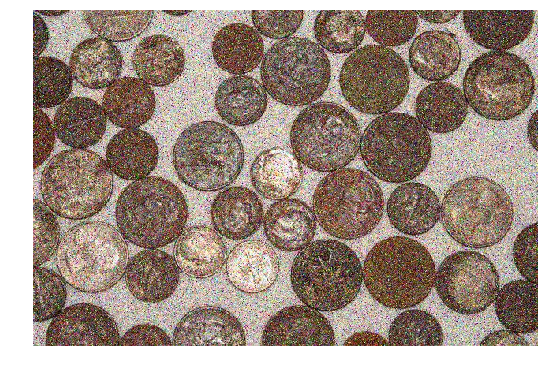

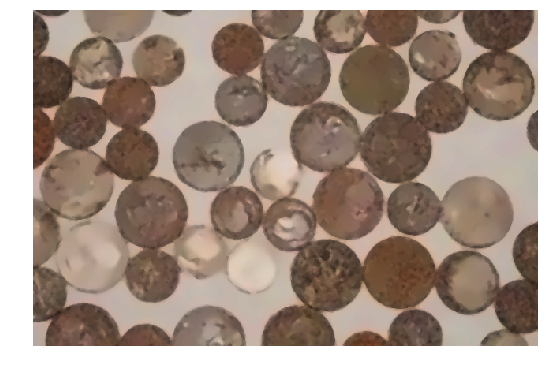

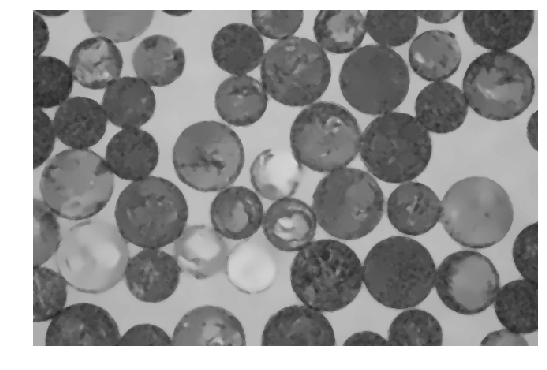

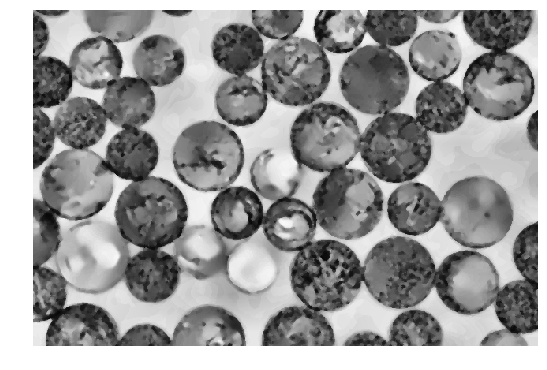

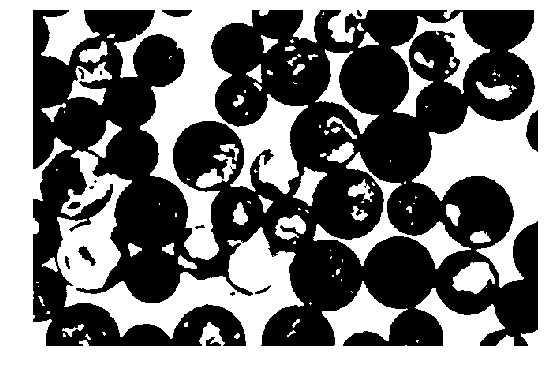

In [44]:
coins_noize_original = cv2.imread("coins_noize_1.jpg")
show(coins_noize_original, size=7)

coins_noize = cv2.fastNlMeansDenoisingColored(coins_noize_original, h=15, hColor=15)
coins_noize = cv2.fastNlMeansDenoisingColored(coins_noize, h=10, hColor=15)
coins_noize = cv2.medianBlur(coins_noize, 3)
coins_noize = cv2.medianBlur(coins_noize, 5)
show(coins_noize, size=7)

coins_noize_gray = cv2.cvtColor(coins_noize, cv2.COLOR_BGR2GRAY)
show(coins_noize_gray, size=7)

clahe = cv2.createCLAHE(clipLimit=4, tileGridSize=(9,9))
coins_noize_gray = clahe.apply(coins_noize_gray)
show(coins_noize_gray, size=7)

threshold_val, coins_noize_gray = cv2.threshold(coins_noize_gray, 165, 255, cv2.THRESH_BINARY)
show(coins_noize_gray, size=7)

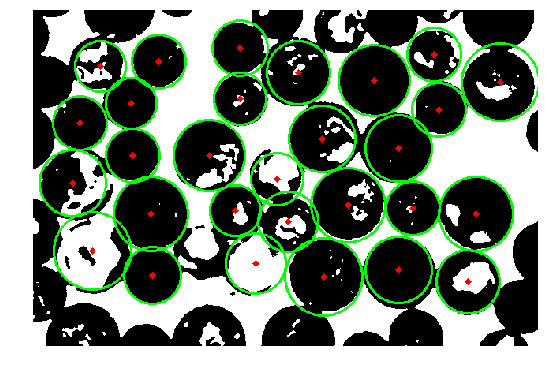

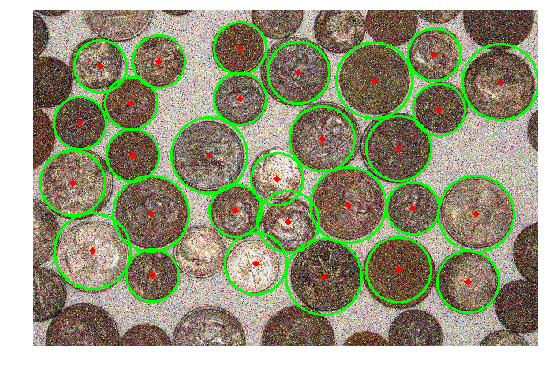

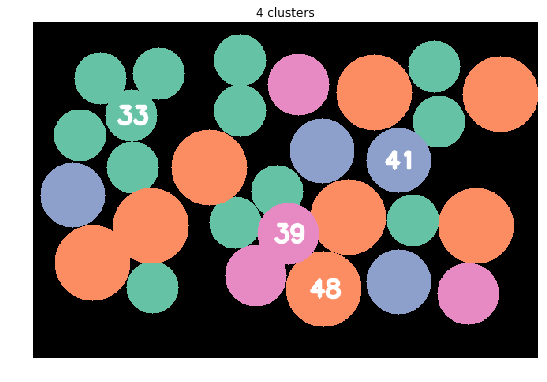

In [47]:
find_circles(coins_noize_gray, 
             {"dp":1.95, "minDist":50,
              "param1":10, "param2":27, 
              "minRadius":30, "maxRadius":50}, 
             coins_noize_original)

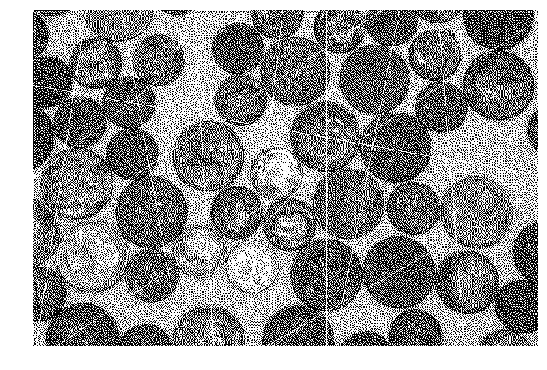

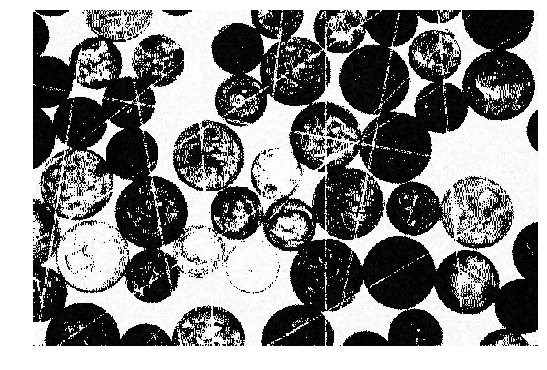

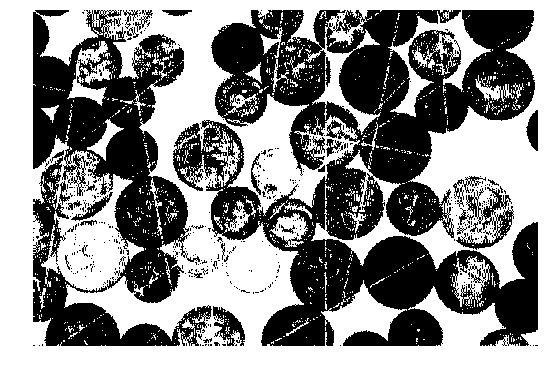

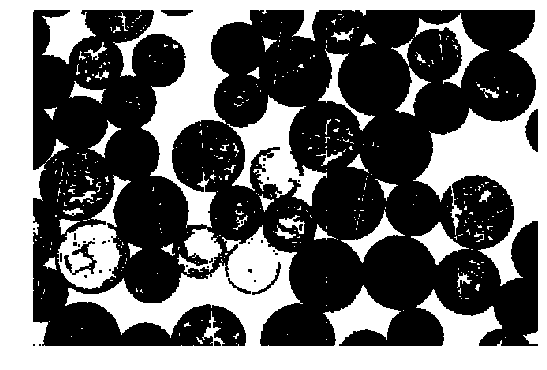

In [112]:
coins_noize_original = cv2.imread("coins_noize_2.jpg")
show(coins_noize_original, size=7)

coins_noize = cv2.fastNlMeansDenoisingColored(coins_noize_original, h=15, hColor=15)
coins_noize = cv2.fastNlMeansDenoisingColored(coins_noize, h=10, hColor=15)
coins_noize = cv2.medianBlur(coins_noize, 3)
show(coins_noize, size=7)

coins_noize_gray = cv2.cvtColor(coins_noize, cv2.COLOR_BGR2GRAY)
#show(coins_noize_gray, size=7)

threshold_val, coins_noize_gray = cv2.threshold(coins_noize_gray, 165, 255, cv2.THRESH_BINARY)
show(coins_noize_gray, size=7)

coins_noize_gray = cv2.erode(coins_noize_gray, None, iterations=1)
show(coins_noize_gray, size=7)

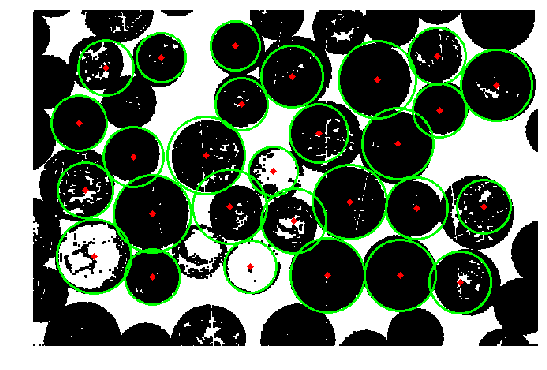

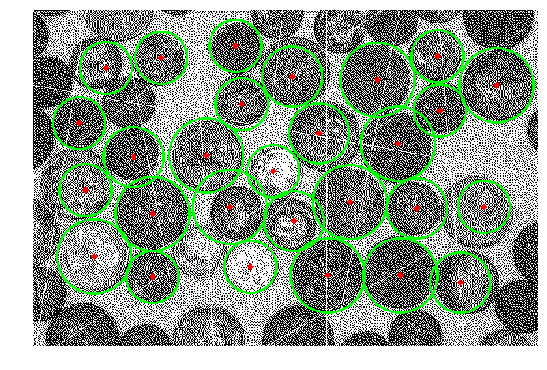

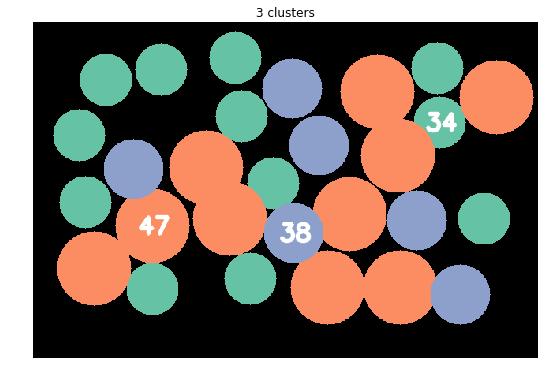

In [124]:
find_circles(coins_noize_gray, 
             {"dp":1.85, "minDist":68,
              "param1":10, "param2":20, 
              "minRadius":30, "maxRadius":50}, 
             coins_noize_original)

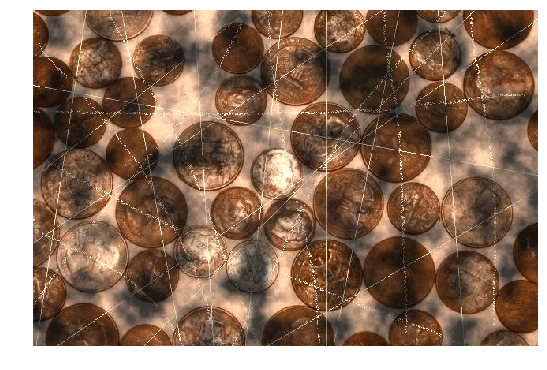

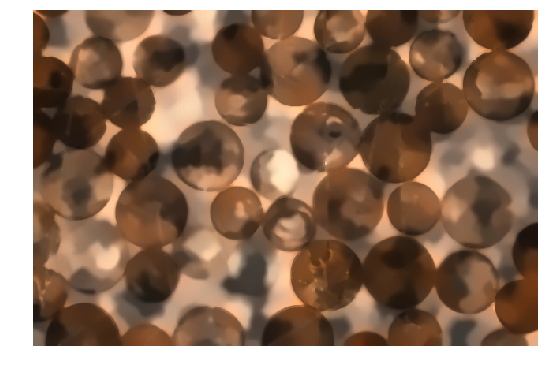

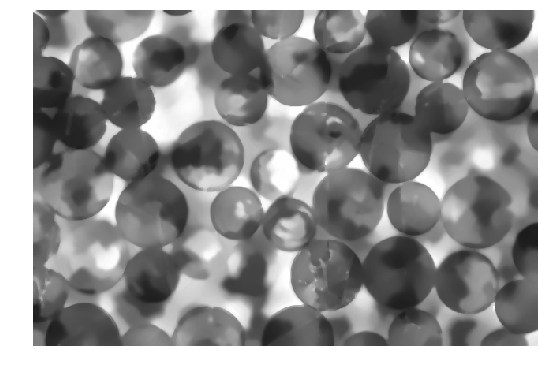

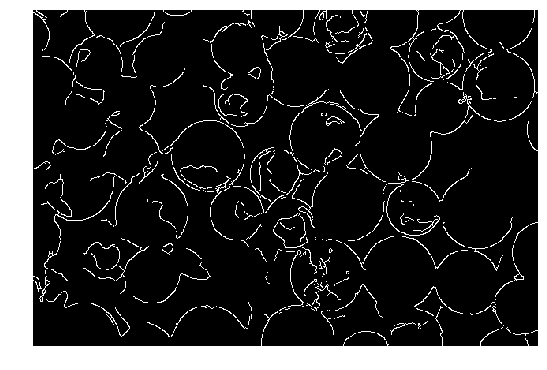

In [135]:
coins_noize_original = cv2.imread("coins_noize_3.jpg")
show(coins_noize_original, size=7)

coins_noize = cv2.fastNlMeansDenoisingColored(coins_noize_original, h=15, hColor=15)
coins_noize = cv2.fastNlMeansDenoisingColored(coins_noize, h=10, hColor=15)
coins_noize = cv2.medianBlur(coins_noize, 3)
coins_noize = cv2.medianBlur(coins_noize, 5)
show(coins_noize, size=7)

coins_noize_gray = cv2.cvtColor(coins_noize, cv2.COLOR_BGR2HSV)[:,:,2]
show(coins_noize_gray, size=7)

coins_noize_gray = cv2.Canny(coins_noize_gray, 10,200)
show(coins_noize_gray, size=7)

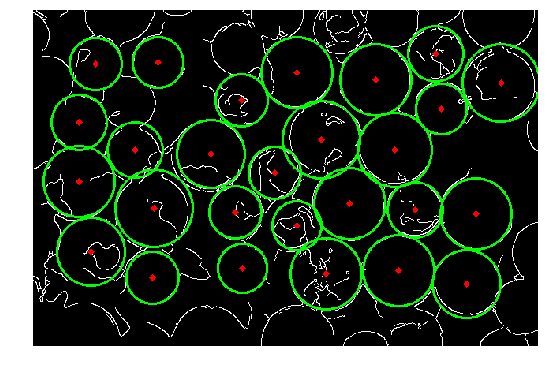

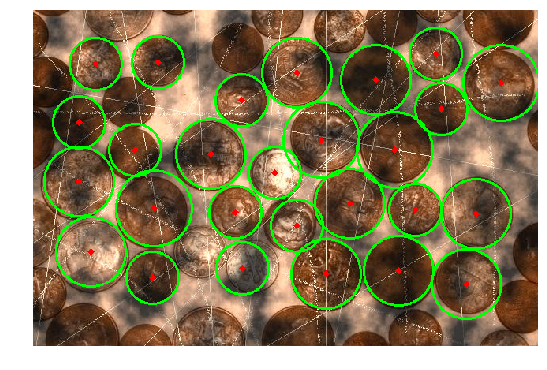

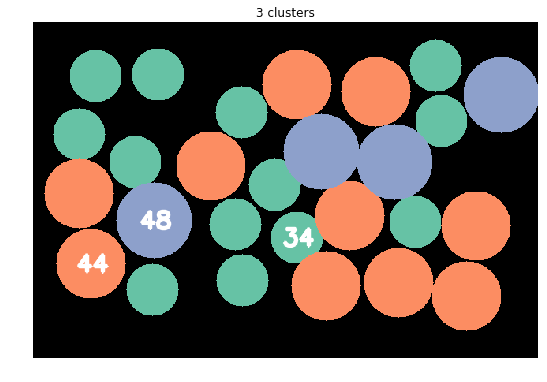

In [136]:
find_circles(coins_noize_gray, 
             {"dp":1.85, "minDist":70,
              "param1":10, "param2":20, 
              "minRadius":30, "maxRadius":50}, 
             coins_noize_original)

### Сравнение глобальных признаков 

Для задач 5 и 6 надо реализовать общую функцию, которая принимет на вход:

* список дескрипторов (**id**, и сам дескриптор) 
* количество максимально похожих для вывода **n**
* функцию сранения дескрипторов

и отдает **n** пар **id** максимально похожих изображений.

In [65]:
def find_nearest_pairs(images, n, comparator):
    
    dists = {}
    
    for img_id_1 in images:
        for img_id_2 in images:
            
            if img_id_1 == img_id_2:
                continue
            
            if ((img_id_1, img_id_2) not in dists) and ((img_id_2, img_id_1) not in dists):
                img_descr_1 = images[img_id_1]
                img_descr_2 = images[img_id_2]
                dists[(img_id_1, img_id_2)] = comparator(img_descr_1, img_descr_2)
                
    return sorted(dists, key=dists.get)[:n]

In [66]:
def show_2_pairs(pair1, pair2, size=7, grayscale=False):
    plt.figure(figsize=(size*5, size))
    
    plt.subplot(1, 5, 1)
    plt.imshow(cv2.cvtColor(cv2.imread(pair1[0]), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.subplot(1, 5, 2)
    plt.imshow(cv2.cvtColor(cv2.imread(pair1[1]), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    zero_img = np.zeros((50, 50)) + 255
    plt.subplot(1, 5, 3)
    plt.imshow(zero_img, cmap='gray', vmin=0, vmax=255)
    plt.axis('off')
    
    plt.subplot(1, 5, 4)
    plt.imshow(cv2.cvtColor(cv2.imread(pair2[0]), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.subplot(1, 5, 5)
    plt.imshow(cv2.cvtColor(cv2.imread(pair2[1]), cv2.COLOR_BGR2RGB))
    plt.axis('off')

**5. (10 баллов)** Посмотрите на изображения в папке *Coral*. Посчитайте гистограммы изображений. Выведите на экран 20 пар изображений с максимально похожими гистограммами. В этом задании надо попробовать:
* различные цветовые пространства (RGB, HSV, CIELab)
* различные способы разбиения на бины (разное количество для каждой характеристики)
* различные метрики сравнения $L_2$, $\chi^2$, пересечение гистограм

In [158]:
def calc_hist_descriptors(imgs_paths, color_space, n_bins):
    
    res = {}
    for img_path in imgs_paths:
        img = cv2.imread(img_path) 
        
        spaces = {"RGB" : cv2.COLOR_BGR2RGB, "HSV" : cv2.COLOR_BGR2HSV, "CIELab" : cv2.COLOR_BGR2Lab}
        img = cv2.cvtColor(img, spaces[color_space])
        
        channels = cv2.split(img)       
        hists = [cv2.calcHist([cur_channel], [0], None, [n_bins], [0, 256]) 
                 for cur_channel in channels]  
        
        hists = [cv2.normalize(h, h, 1.0, 0.0, cv2.NORM_L1) for h in hists]
        
        res[img_path] = hists
    return res

In [159]:
def chisqr_comp(descr1, descr2):
    ans = 0
    for i in range(3):
        ans += cv2.compareHist(descr1[i], descr2[i], cv2.HISTCMP_CHISQR)
    return ans

In [160]:
def histIntersect_comp(descr1, descr2):
    ans = 0
    for i in range(3):
        ans += cv2.compareHist(descr1[i], descr2[i], cv2.HISTCMP_INTERSECT)
    return 1 / ans

In [68]:
def l2_comp(descr1, descr2):
    if len(descr1) > 3:
        return np.linalg.norm(descr1 - descr2)
    
    ans = 0
    for i in range(3):
        ans += np.linalg.norm(descr1[i] - descr2[i])
    
    return ans

In [162]:
corel_paths = glob.glob('datasets/Corel/*')

* RGB
* 256 бинов
* $\chi^2$

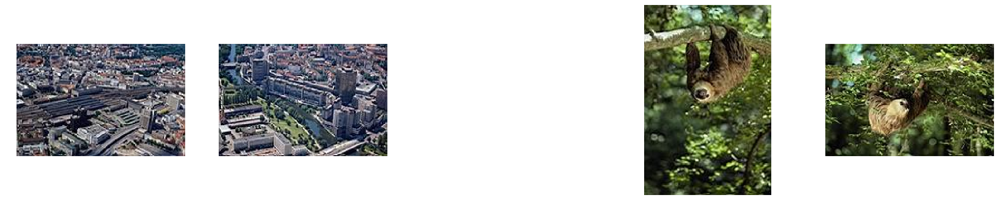

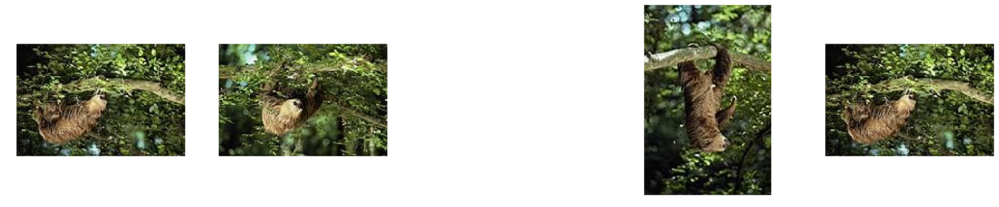

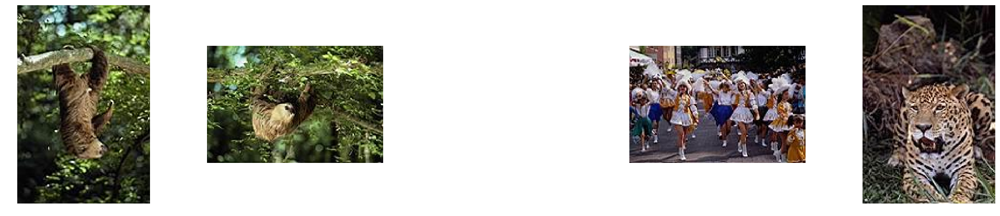

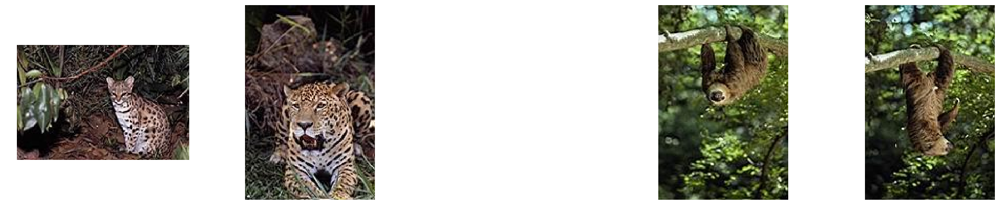

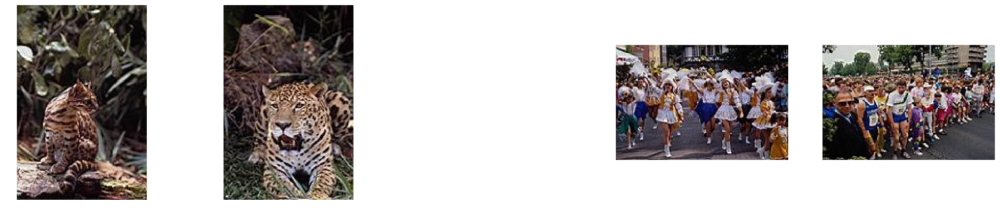

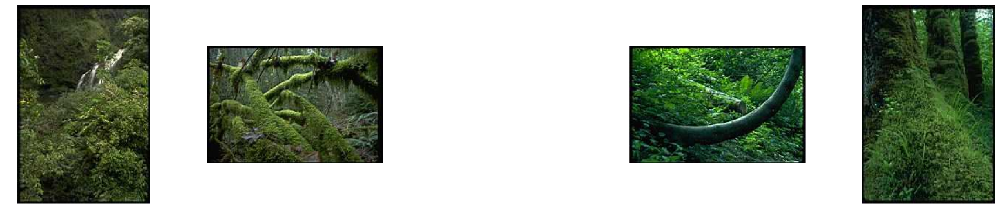

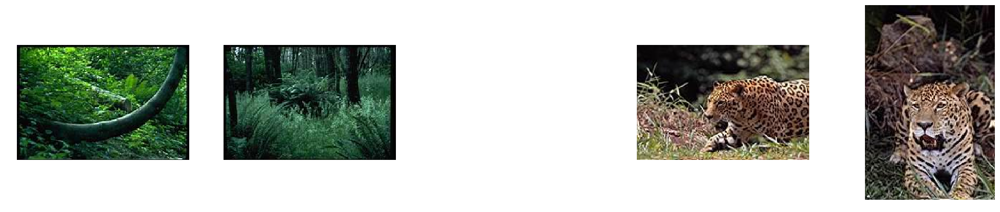

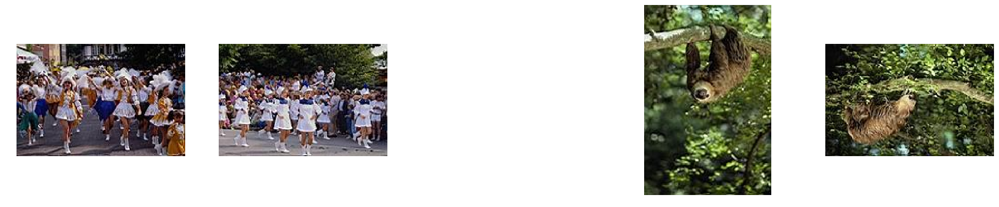

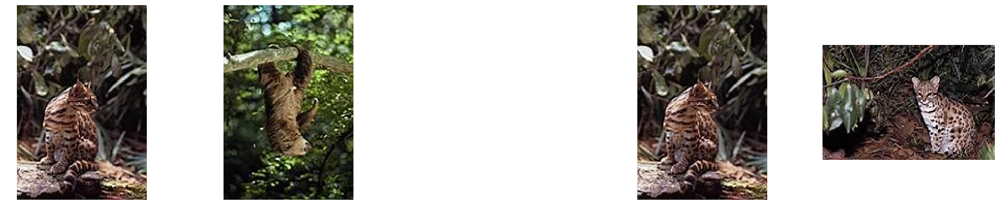

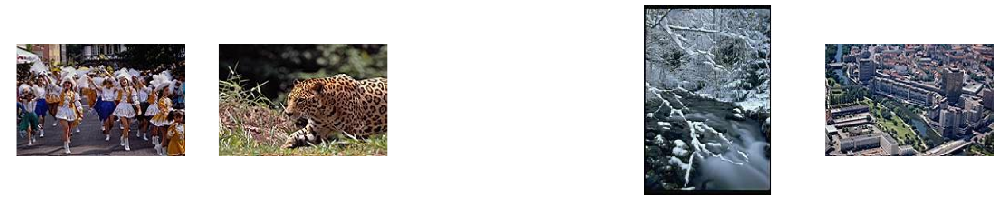

In [163]:
corel_imgs = calc_hist_descriptors(corel_paths, "RGB", 256)

nearest_pairs = find_nearest_pairs(corel_imgs, 20, chisqr_comp)

for i in range(0, len(nearest_pairs), 2):
    show_2_pairs(nearest_pairs[i], nearest_pairs[i+1])

* HSV
* 128 бинов
* пересечение гистограм

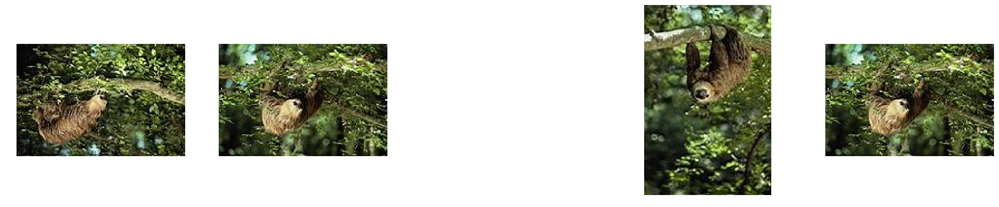

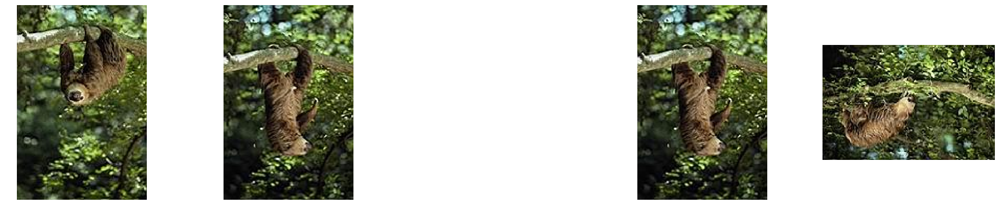

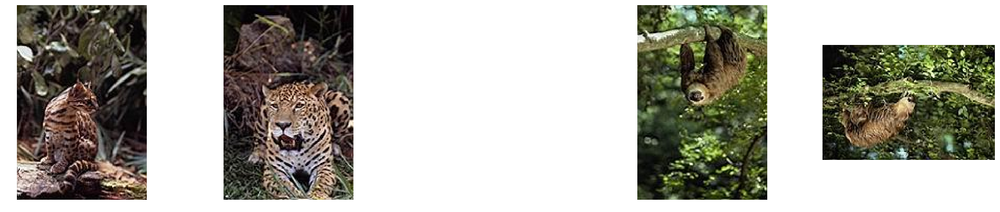

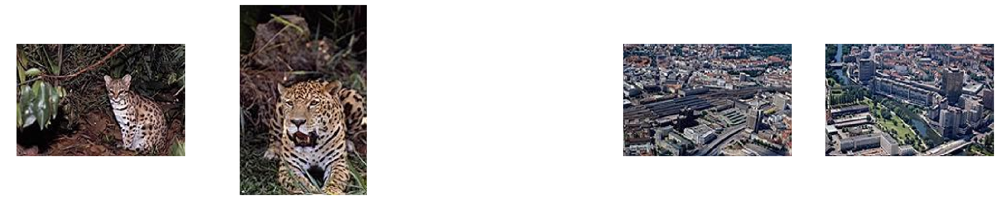

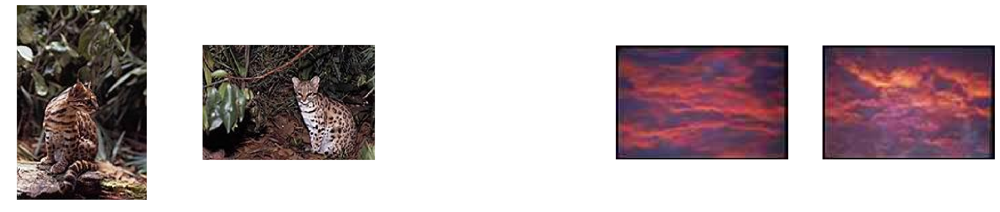

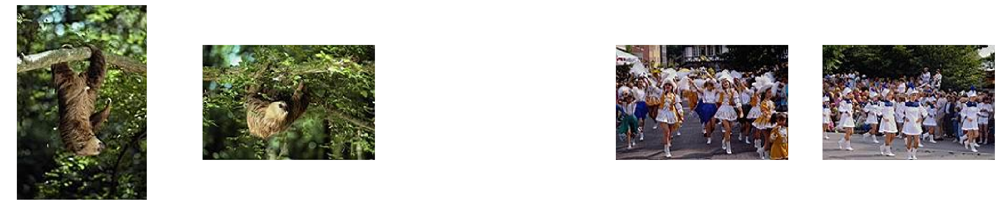

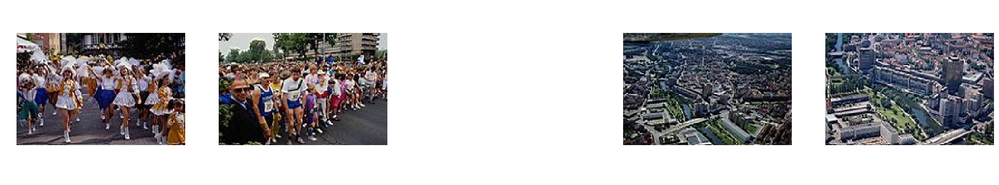

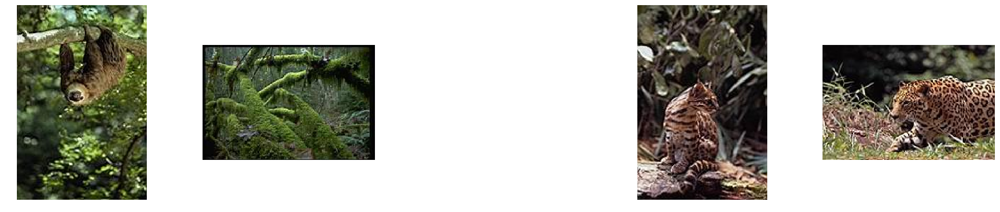

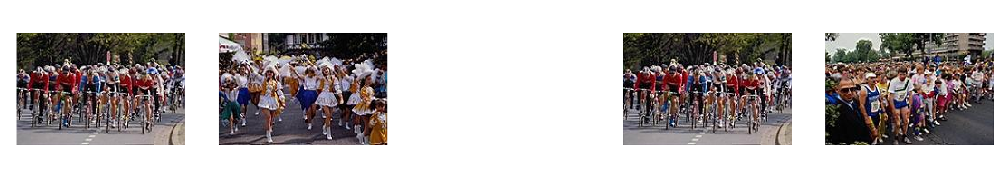

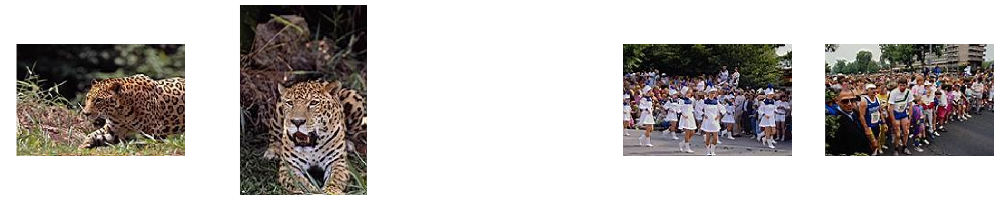

In [164]:
corel_imgs = calc_hist_descriptors(corel_paths, "HSV", 128)

nearest_pairs = find_nearest_pairs(corel_imgs, 20, histIntersect_comp)

for i in range(0, len(nearest_pairs), 2):
    show_2_pairs(nearest_pairs[i], nearest_pairs[i+1])

* CIELab
* 85 бинов
* $L_2$

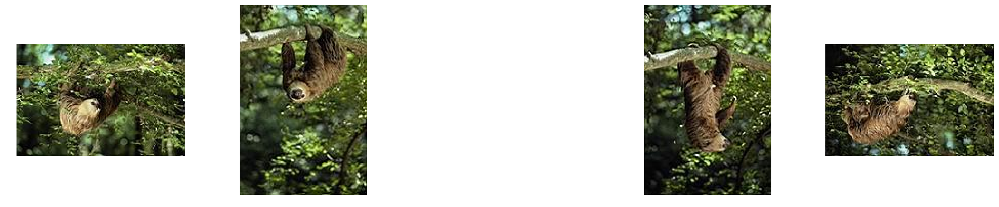

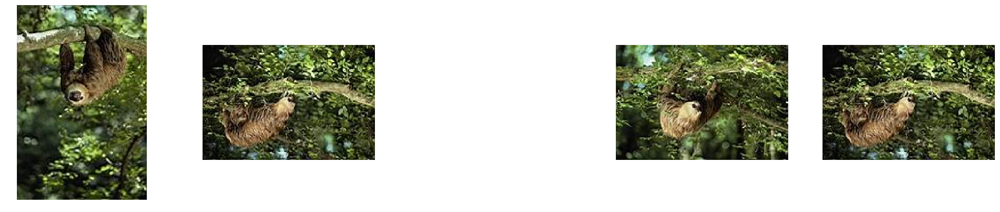

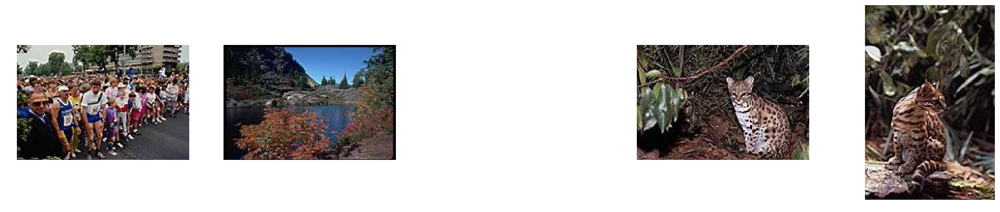

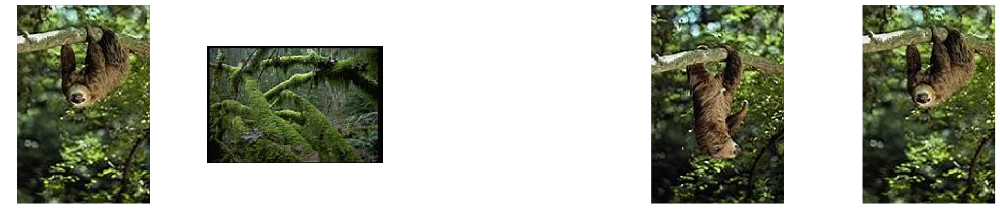

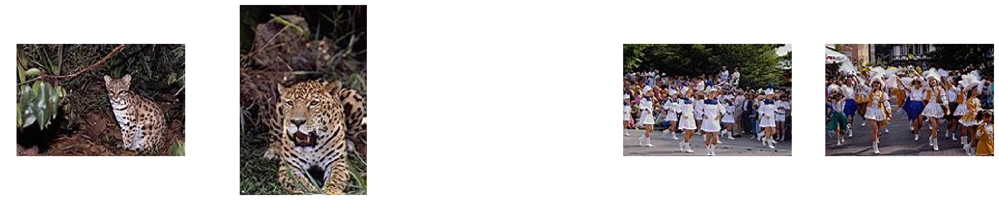

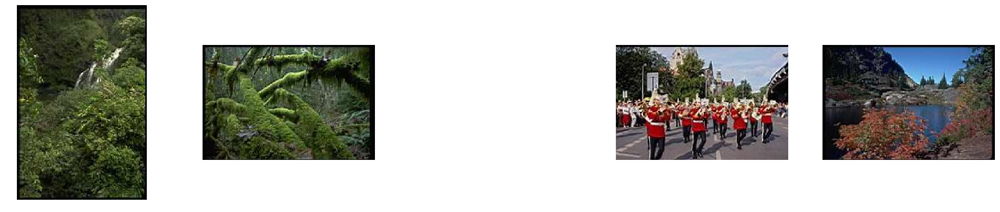

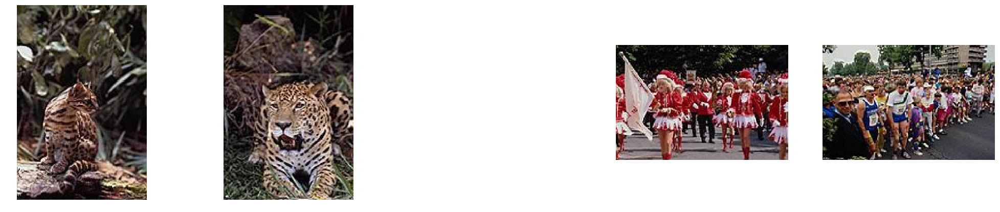

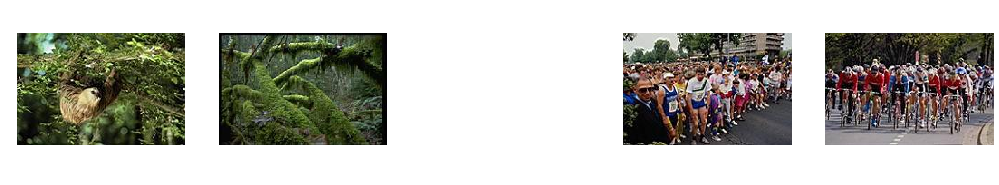

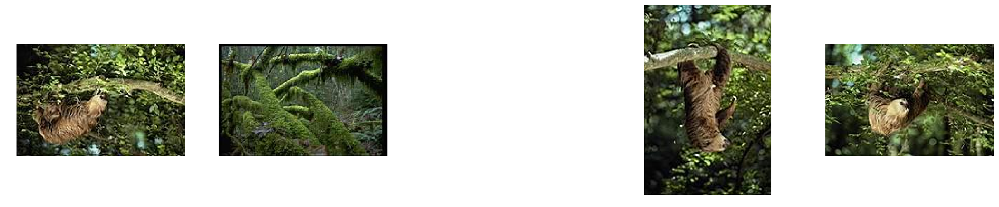

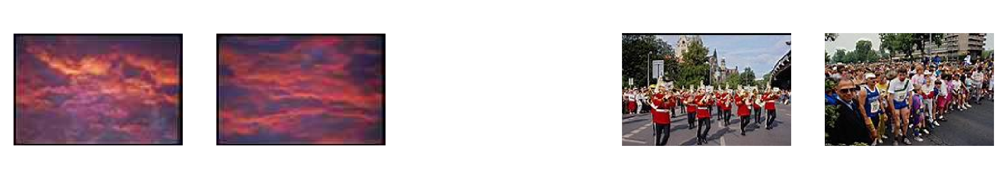

In [148]:
corel_imgs = calc_hist_descriptors(corel_paths, "CIELab", 85)

nearest_pairs = find_nearest_pairs(corel_imgs, 20, l2_comp)

for i in range(0, len(nearest_pairs), 2):
    show_2_pairs(nearest_pairs[i], nearest_pairs[i+1])

**6. (10 баллов)** Посмотрите на изображения в папке *leaves*. Посчитайте дескрипторы Фурье для каждого листочка изображений. Выведите на экран 20 пар изображений с максимально похожими дескрипторами.

In [62]:
def calc_fourier_descriptors(imgs_paths):
    res = {}
    
    for img_path in imgs_paths:
        img = cv2.imread(img_path)
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        _, img_gray = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)

        contour = np.argwhere(img_gray == 0)

        centroid = np.mean(contour, axis=0)
        contour = contour - centroid

        x = contour[:, 0]
        y = contour[:, 1]

        phi = np.arctan2(y, x)
        rho = np.sqrt(x**2 + y**2)

        zipped = zip(phi, rho)
        zipped = sorted(zipped)
        phi, rho = zip(*zipped)

        descriptors = np.fft.fft(rho)

        descriptors = np.abs(descriptors) / np.abs(descriptors[0])
        descriptors = descriptors[1:100]

        #plt.figure(figsize=(5,5))
        #plt.plot(descriptors)
        #plt.title(img_path) 
    
        res[img_path] = descriptors
    
    return res

Я проверяла сначала работу дескрипторов на своём простом датасете.

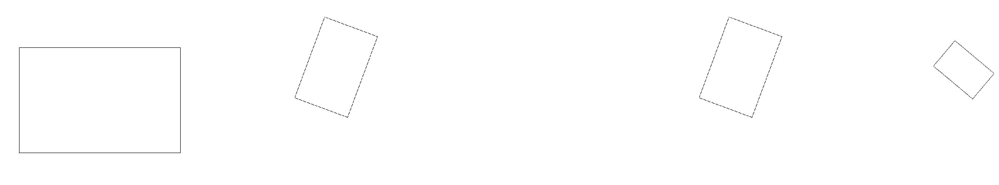

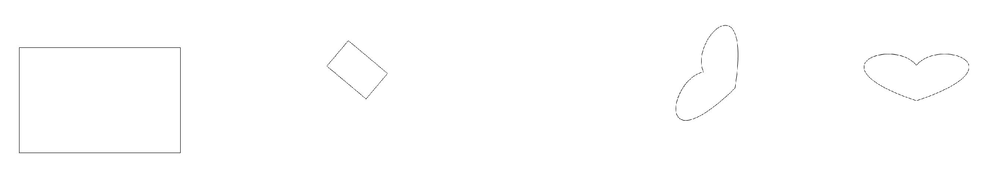

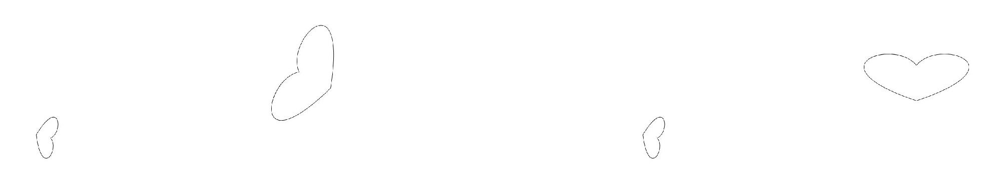

In [69]:
test_paths = sorted(glob.glob('datasets/test/*'))
test_imgs = calc_fourier_descriptors(test_paths)

nearest_pairs = find_nearest_pairs(test_imgs, 6, l2_comp)

for i in range(0, len(nearest_pairs), 2):
    show_2_pairs(nearest_pairs[i], nearest_pairs[i+1])

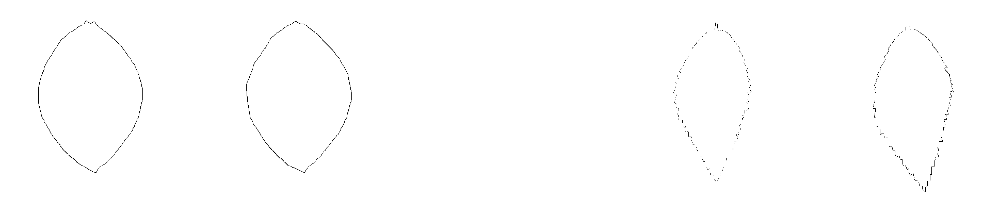

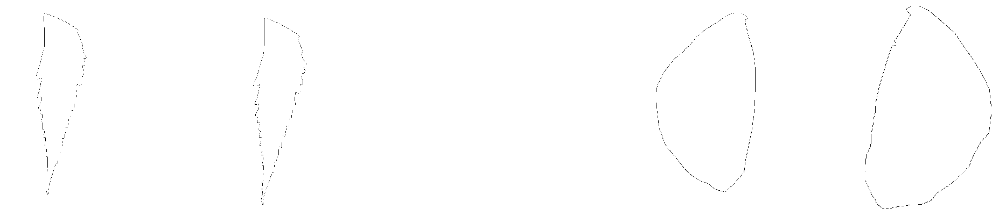

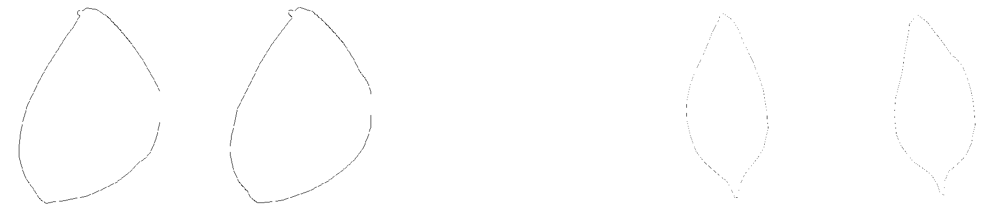

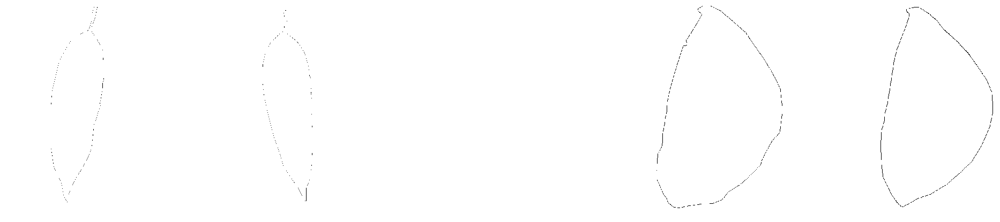

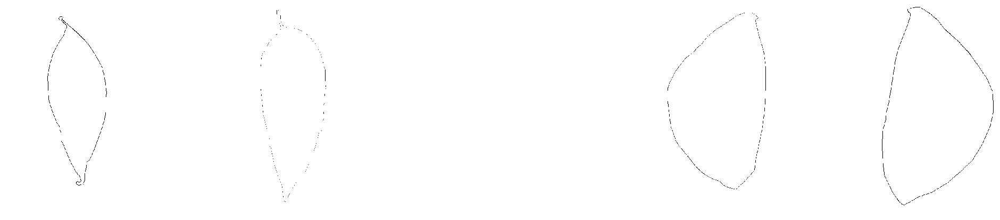

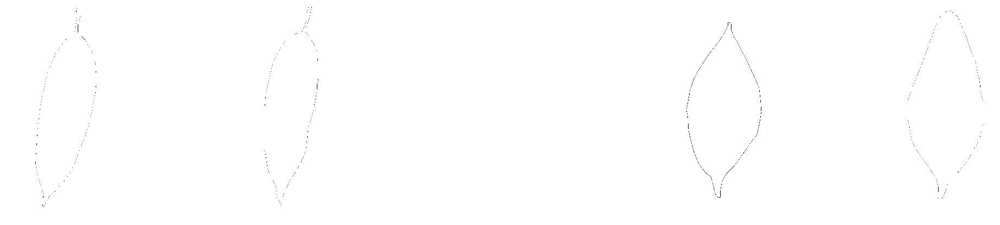

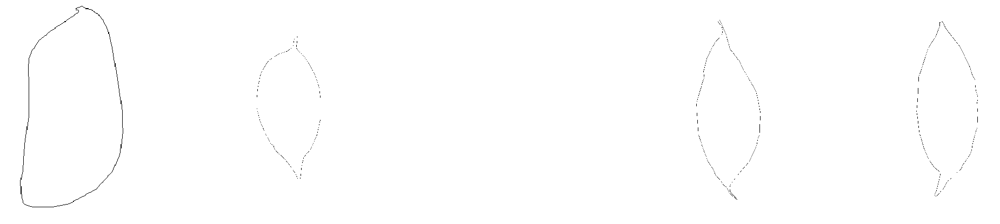

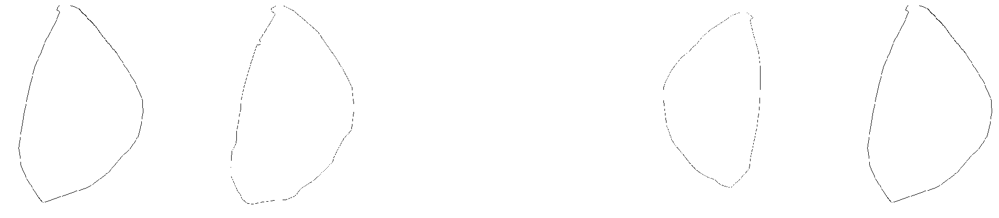

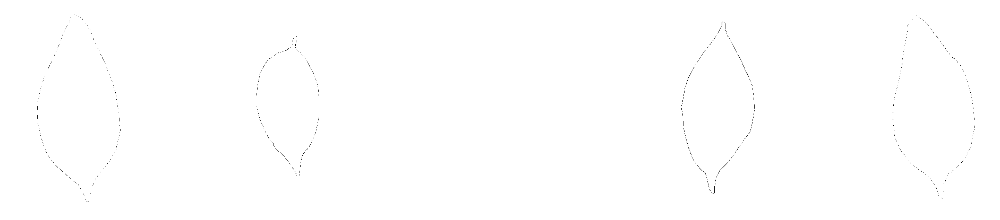

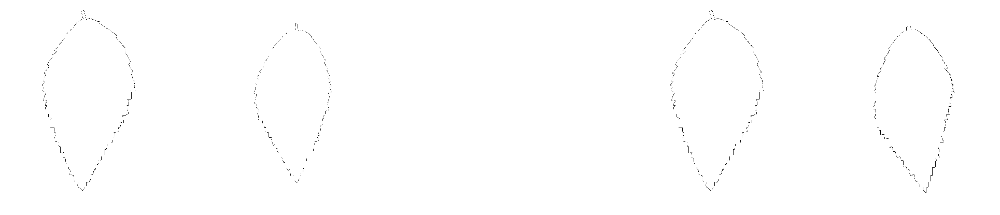

In [70]:
leaves_paths = sorted(glob.glob('datasets/leaves/*'))
leaves_imgs = calc_fourier_descriptors(leaves_paths)

nearest_pairs = find_nearest_pairs(leaves_imgs, 20, l2_comp)

for i in range(0, len(nearest_pairs), 2):
    show_2_pairs(nearest_pairs[i], nearest_pairs[i+1])